#### Import Libraries

In [1]:
import os 
import sys
sys.path.append(os.path.join(os.getcwd(), '..', '..', 'ConvLSTM_PyTorch_master'))
import numpy as np 
import pandas as pd
import xarray as xr 
import matplotlib.pyplot as plt 
import seaborn as sns
import cartopy.crs as ccrs
from tqdm import tqdm

import torch
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader
from torch import nn
import torchmetrics.image as t_metrics 

from data_standarization import mean_std_scaler

from net_params_auto import convlstm_encoder_params, convlstm_decoder_params
from encoder import Encoder
from decoder import Decoder
from model import ED

#from captum.attr import (Saliency, InputXGradient, IntegratedGradients, DeepLift, NoiseTunnel)

#### Upload data

In [2]:
frames_predict = 12
batch_size = 1 # Keep batch_size at 1, otherwise gradients from different samples will be mixed.
num_layers = 4
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#device = 'cpu'
print(device)

split = 'valid' #train/valid

cuda:0


In [3]:
class ERA5_dataset(torch.utils.data.Dataset):

    def __init__(self, split):
        super(ERA5_dataset, self).__init__()

        # Define the path
        self.data_path = os.path.join(os.getcwd(), '..', '..', 'input_data', 'hourly')

        # Read the data
        if split == 'train':
            print('Training dataset')
            self.data = xr.open_dataset(os.path.join(self.data_path, 'train_data_hourly_m_s_2010_2019.nc'))['ws']
        elif split == 'valid':
            print('Validation dataset')
            self.data = xr.open_dataset(os.path.join(self.data_path, 'valid_data_hourly_m_s_2020_2020.nc'))['ws']

        #I order the coordinates
        coords = self.data.coords
        self.original_coords = {'time': coords['time'], 'latitude': coords['latitude'], 'longitude': coords['longitude']}
        self.dims = ["time", "latitude", "longitude"]
        
        self.data = np.array(self.data)
        self.data = torch.from_numpy(self.data).float()

        self.dataset_spatial_size = self.data.shape[-1]

        self.stats = xr.open_dataset(os.path.join(self.data_path, 'statistics_train_ds_per_pixel.nc'))
        self.mean = self.stats["mean"]
        self.std = self.stats["std"]

        self.mean = np.array(self.mean)
        self.mean = torch.from_numpy(self.mean).float()

        self.std = np.array(self.std)
        self.std = torch.from_numpy(self.std).float()
        
        self.data = mean_std_scaler(self.data, self.mean, self.std)
        
        #chunkify: That is, reshape data in an array where each element are a 3D cube of 12x144x144 
        # I calcule data.shape[0]/12)*12 so that the number of selected data are divisible by 12
        self.data = self.data[:int(self.data.shape[0]/frames_predict)*frames_predict].reshape((int(self.data.shape[0]/frames_predict), frames_predict, self.dataset_spatial_size, self.dataset_spatial_size))

        # (inputs are given as data[:-1], targets as data[1:])
        self.inputs = self.data[:-1]
        self.targets = self.data[1:]

        # I do the same transformations for the coordinats, specifically the time coordinate
        self.orig_coords_time = np.array(self.original_coords["time"])
        self.orig_coords_lon = np.array(self.original_coords["longitude"])
        self.orig_coords_lat = np.array(self.original_coords["latitude"])

        self.orig_coords_time_reshaped = self.orig_coords_time[:int(self.orig_coords_time.shape[0] / frames_predict) * frames_predict].reshape((int(self.orig_coords_time.shape[0] / frames_predict), frames_predict))

        self.input_coords_time_reshaped = self.orig_coords_time_reshaped[:-1]
        self.target_coords_time_reshaped = self.orig_coords_time_reshaped[1:]

        self.spatial_coords = {'latitude': coords['latitude'], 'longitude': coords['longitude']}

        input_coords_time = self.input_coords_time_reshaped.reshape((int(self.input_coords_time_reshaped.shape[0] * frames_predict)))
        target_coords_time = self.target_coords_time_reshaped.reshape((int(self.target_coords_time_reshaped.shape[0] * frames_predict)))

        self.input_coords = {'time': input_coords_time, 'latitude': coords['latitude'], 'longitude': coords['longitude']}
        self.target_coords = {'time': target_coords_time, 'latitude': coords['latitude'], 'longitude': coords['longitude']}

        #print('input/target division done.')

        self.dataset = TensorDataset(*(self.inputs, self.targets, self.targets))
            
    def __getitem__(self, index):
        input = self.dataset.tensors[0][index]
        target = self.dataset.tensors[1][index]
        sup = self.dataset.tensors[2][index]
        
        return input, target, sup, index
    
    #return dataset length
    def __len__(self):
        return len(self.dataset)

In [4]:
data = ERA5_dataset(split=split)
dataLoader = DataLoader(data, batch_size=batch_size, shuffle=True, drop_last=False, num_workers=20)

Validation dataset


#### Uplaod Model

In [5]:
model_path = os.path.join(os.getcwd(), '..', '..', 'experiments', 'convlstm_mae_4_PerPixel_mean-std_hourly_100_epochs_FP12', 'models', 'ckpt')

In [6]:
def load_model():

    encoder_params = convlstm_encoder_params(num_layers, input_len=frames_predict, device=device)
    decoder_params = convlstm_decoder_params(num_layers, output_len=frames_predict, device=device)

    encoder = Encoder(encoder_params[0], encoder_params[1]).to(device)
    decoder = Decoder(decoder_params[0], decoder_params[1], num_layers).to(device)
    
    net = ED(encoder, decoder)

    if torch.cuda.device_count() > 1:
        net = nn.DataParallel(net)
    
    net.to(device)

    torch.cuda.empty_cache()

    # Loading model
    model_info = torch.load(os.path.join(model_path, 'checkpoint_50.pth.tar'), map_location=device)
        
    net.load_state_dict(model_info['state_dict'])

    return net 

In [7]:
net = load_model().eval()
print('ConvLSTM Model loaded successfully')

/tmp/ipykernel_201449/99982798.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_info = torch.load(os.path.join(model_path, 'checkpoint_50.pth.tar'), map_location=d

ConvLSTM Model loaded successfully


#### Saliency Function

In [8]:
def compute_saliency(model, input_tensor, output_frame=0, frames_predict=12):
    """
    Calcule the Saliency maps for the ConvLSTM model.

    Parameters:
    - model: PreTrained PyTorch ConvLSTM model.
    - input_tensor: Input Tensor (batch_size, 12, 144, 144).
    - output_frame: horizon to calcule the Saliency maps.
    
    Returns:
    - saliency: Saliency Map (batch_size, 12, 144, 144).
    """

    #model.eval() 
    input_tensor.requires_grad = True  # Allow gradient calculation

    # forward pass
    output = model(input_tensor.unsqueeze(2)).squeeze(2)  #(batch_size, 12, 144, 144)

    model.zero_grad()
    
    # Select the horizon to be analyzed.
    if output_frame >= 0 and output_frame <= frames_predict-1:
        target = output[:, output_frame]
    
    elif output_frame > frames_predict-1:
        raise ValueError(f"output must be smaller than {frames_predict-1}")
    
    elif output_frame == -1:
        target = output
    
    elif output_frame < -1:
        raise ValueError(f"output must be non-negative")
    
    # BACKPROPAGATION TO OBTAIN GRADIENTS
    # target.mean(dim=(0, 1, 2)).backward() #.backward(retain_graph=True) If we want to keep the gradient for other passages.
    target.mean().backward()  # Calcule gradientes with respect to the input

    # Obtain absolut and normalized gradients
    saliency = input_tensor.grad.abs()#.detach().cpu().numpy()  # (batch_size, 12, 144, 144)
    #saliency = saliency[:, :]  # (batch_size, 12, 144, 144)

    # Clean the gradients after the forward pass
    input_tensor.grad.zero_()
    
    return saliency, output

#### Input x Gradient

In [9]:
def compute_input_gradients(input_tensor, saliency):
    """
    Calcule the InputxGradient  maps for the ConvLSTM model.

    Parameters:
    - input_tensor: Sample (batch_size, 12, 144, 144).
    - saliency: Saliency map (batch_size, 12, 144, 144).

    Return:
    - input_grad: InputxGradient map (batch_size, 12, 144, 144).
    """
    input_grad = input_tensor * saliency
    return input_grad


#### Integrated Gradients

In [10]:
def compute_integrated_gradients(model, input_tensor, output_frame=0, baseline=None, num_steps=10, frames_predict=12):
    """
    Calcule the Integrated Gradients.

    Parameters:
    - model: PreTrained PyTorch ConvLSTM model.
    - input_tensor: Input Tensor (batch_size, 12, 144, 144).
    - output_frame: horizon to calcule the Integrated Gradients maps.
    - baseline: Baseline for Integrated Gradients (zero tensor if not specified).
    - num_steps: number of steps to approx the gradients.

    Returns:
    - integrated_gradients: Integrated Gradient maps (batch_size, 12, 144, 144).
    """

    input_tensor = input_tensor.to('cpu')

    if baseline is None:
        baseline = torch.zeros_like(input_tensor)  # Baseline de referencia
    
    # Interpolamos entre el baseline y la entrada original
    scaled_inputs = [baseline + (float(i) / num_steps) * (input_tensor - baseline) for i in range(1, num_steps + 1)]
    scaled_inputs = torch.stack(scaled_inputs).reshape(-1, *input_tensor.shape[1:])  # (num_steps*batch, 12, 144, 144)
    scaled_inputs = scaled_inputs.detach()
    
    scaled_inputs.requires_grad = True
    model.zero_grad()
    #output_scaled = model(scaled_inputs.unsqueeze(2)).squeeze(2)

    output_scaled = []

    for i in range(num_steps):
        batch = scaled_inputs[i * batch_size : (i + 1) * batch_size].to('cuda')
        output_batch = model(batch.unsqueeze(2)).squeeze(2)
        output_scaled.append(output_batch.to('cpu'))
        del output_batch
        torch.cuda.empty_cache()

    # Concatenamos los resultados
    output_scaled = torch.cat(output_scaled, dim=0)

    # Select the horizon to be analyzed.
    if output_frame >= 0 and output_frame <= frames_predict-1:
        target_scaled = output_scaled[:, output_frame]

        # BACKPROPAGATION TO OBTAIN GRADIENTS
        target_scaled.mean().backward() #.backward(retain_graph=True) If we want to keep the gradient for other passages.
    
    elif output_frame > frames_predict-1:
        raise ValueError(f"output must be smaller than {frames_predict-1}")
    
    elif output_frame == -1:
        target_scaled = output_scaled
        
        # BACKPROPAGATION TO OBTAIN GRADIENTS
        target_scaled.mean().backward() #.backward(retain_graph=True) If we want to keep the gradient for other passages.
    
    elif output_frame < -1:
        raise ValueError(f"output must be non-negative")
    
    avg_grads = scaled_inputs.grad.mean(dim=0)  # Promediamos los gradientes
    integrated_gradients = (input_tensor - baseline) * avg_grads

    # Clean the gradients after the forward pass
    scaled_inputs.grad.zero_()
    
    return integrated_gradients


##### Guided Backpropagation

In [11]:
def activation_hook(module, grad_input, grad_output):
    # Para ReLU: limitamos los gradientes negativos
    if isinstance(module, torch.nn.ReLU):
        return (torch.clamp(grad_input[0], min=0.0),)
    
    # Para LeakyReLU: limitamos gradientes negativos, pero solo si son negativos
    elif isinstance(module, torch.nn.LeakyReLU):
        # Si la pendiente negativa es pequeña, solo permitimos gradientes positivos
        return (torch.clamp(grad_input[0], min=0.0),)
    
    # Si no es ReLU ni LeakyReLU, no cambiamos nada
    return grad_input

def compute_guided_backpropagation(model, input_tensor, output_frame=0, frames_predict=12):
    """
    Guided Backpropagation Calculation.

    Parameters:
    - model: PreTrained PyTorch ConvLSTM model.
    - input_tensor: Input Tensor (batch_size, 12, 144, 144).
    - output_frame: horizon to calcule the Guided_backpropagation maps.

    Returns:
    - guided_bp: Guided Backpropagation Maps (batch_size, 12, 144, 144).
    """    

    # Register the hook in the ReLU
    hooks = []
    for layer in model.modules():
        if isinstance(layer, torch.nn.ReLU) or isinstance(layer, torch.nn.LeakyReLU):
            hooks.append(layer.register_backward_hook(activation_hook))
    
    input_tensor.requires_grad = True
    model.zero_grad()
    
    # Forward pass
    output = model(input_tensor.unsqueeze(2)).squeeze(2)
    #target = output[:, output_frame]

    # Select the horizon to be analyzed.
    if output_frame >= 0 and output_frame <= frames_predict-1:
        target = output[:, output_frame]
    
    elif output_frame > frames_predict-1:
        raise ValueError(f"output must be smaller than {frames_predict-1}")
    
    elif output_frame == -1:
        target = output
    
    elif output_frame < -1:
        raise ValueError(f"output must be non-negative")
    
    # BACKPROPAGATION TO OBTAIN GRADIENTS
    #target.mean(dim=(1, 2)).backward() #.backward(retain_graph=True) If we want to keep the gradient for other passages.
    target.mean().backward()  # Calcule gradientes with respect to the input
    
    guided_bp = input_tensor.grad.clone()  # Clonar los gradientes
    
    # Deshacer el registro de los hooks
    for hook in hooks:
        hook.remove()

    # Clean the gradients after the forward pass
    input_tensor.grad.zero_()  
    
    return guided_bp, output

#### GradCAM

In [12]:
def compute_gradcam(model, input_tensor, output_frame=0, target_layer=None, frames_predict=12):
    """
    Grad-CAM Calculation.

    Parameters:
    - model: PreTrained PyTorch ConvLSTM model.
    - input_tensor: Input Tensor (batch_size, 12, 144, 144).
    - output_frame: horizon to calculate the Saliency maps.
    - target_layer: Layer to compute Grad-CAM (if not provided, last ConvLSTM layer will be used).

    Returns:
    - gradcam: Grad-CAM Map (batch_size, 144, 144).
    """

    # Si no se proporciona target_layer, seleccionar la última capa ConvLSTM o una capa específica
    if target_layer is None:
        target_layer = list(model.modules())[-2]  # Última capa ConvLSTM
        #print(f"Using the last layer of the ConvLSTM model: {target_layer}")
    
    activations = {}
    gradients = {}

    # Hooks para capturar activaciones y gradientes
    def forward_hook(module, inp, out):
        activations["value"] = out

    def backward_hook(module, grad_in, grad_out):
        gradients["value"] = grad_out[0]

    # Registrar hooks en la capa objetivo
    forward_hook_handle = target_layer.register_forward_hook(forward_hook)
    backward_hook_handle = target_layer.register_backward_hook(backward_hook)
    
    # Asegurar que el tensor requiere gradientes
    input_tensor.requires_grad = True

    # Realizar pase hacia adelante
    output = model(input_tensor.unsqueeze(2)).squeeze(2)  # (batch_size, 12, 144, 144)
    
    # Selección del frame de salida
    #target = output[:, output_frame]

    # Backpropagation para obtener los gradientes
    #target.mean(dim=(1, 2)).backward(retain_graph=True)

    # Selection the output frame and backpropagation
    if output_frame >= 0 and output_frame <= frames_predict-1:
        target = output[:, output_frame]
    
    elif output_frame > frames_predict-1:
        raise ValueError(f"output must be smaller than {frames_predict-1}")
    
    elif output_frame == -1:
        target = output
    
    elif output_frame < -1:
        raise ValueError(f"output must be non-negative")
    
    # BACKPROPAGATION TO OBTAIN GRADIENTS
    #target.mean(dim=(1, 2)).backward() #.backward(retain_graph=True) If we want to keep the gradient for other passages.
    target.mean().backward()  # Calcule gradientes with respect to the input

    # Grad-CAM: Promediar gradientes y calcular el mapa
    pooled_grads = torch.mean(gradients["value"], dim=(2, 3))  # Promedio de gradientes
    gradcam = torch.relu((activations["value"] * pooled_grads[:, :, None, None]).sum(dim=1))  # (batch_size, 144, 144)

    # Limpiar los gradientes después del pase hacia adelante
    input_tensor.grad.zero_()

    # Eliminar los hooks
    forward_hook_handle.remove()
    backward_hook_handle.remove()

    return gradcam.unsqueeze(0), output


#### Guided GradCAM

In [13]:
def compute_guided_gradcam(guided_backprop, gradcam):
    """
    Guided Grad-CAM Calculation (combination of Guided Backpropagation and Grad-CAM).

    Parameters:
    - guided_backprop: Guided Backpropagation Gradients (batch_size, 12, 144, 144).
    - gradcam: Grad-CAM map (batch_size, 144, 144).

    Return:
    - guided_gradcam: Guided Grad-CAM map (batch_size, 12, 144, 144).
    """

    guided_gradcam = guided_backprop * gradcam
    return guided_gradcam


#### SmothGradient of a technique. Not for GradCAM or derived

In [14]:
def smooth_gradient(method1, method2, net, inputs, output_frame, num_samples=50, noise_level=0.1):
    """
    Applies SmoothGrad to a given saliency method.
    
    Parameters:
    - method: Function to compute saliency (e.g., compute_saliency, compute_guided_backpropagation).
    - net: Pretrained PyTorch model.
    - inputs: Input tensor (batch_size, 12, 144, 144).
    - output_frame: Output frame index for which to compute the gradient-based map.
    - num_samples: Number of noisy samples to average.
    - noise_level: Standard deviation of the Gaussian noise.
    
    Returns:
    - SmoothGrad-enhanced saliency map (same shape as inputs).
    """
    smooth_map = torch.zeros_like(inputs).to('cuda')
    smooth_input_map = torch.zeros_like(inputs).to('cuda')

    for _ in range(num_samples):
        noise = torch.randn_like(inputs) * noise_level  # Gaussian noise
        noisy_input = (inputs + noise).clone().detach().requires_grad_(True)

        # Compute saliency using the provided method
        if method1.__name__ == 'compute_saliency':

            saliency, preds = method1(net, noisy_input, output_frame)

            input_saliency = method2(noisy_input, saliency)

            smooth_map += saliency
            smooth_input_map += input_saliency

            return smooth_map / num_samples, smooth_input_map / num_samples, preds 
        
        elif method1.__name__ == 'compute_integrated_gradients':
            saliency = method1(net, noisy_input, output_frame, baseline=None, num_steps=2)

            print(saliency.device)
            print(smooth_map.device)

            smooth_map += saliency.to('cuda')
            
            return smooth_map / num_samples

        elif method1.__name__ == 'compute_guided_backpropagation':
            saliency, preds = method1(net, noisy_input, output_frame)        

            smooth_map += saliency
            
            return smooth_map / num_samples, preds

#### Execute Saliency

In [15]:
output_frame = -1

input_maps = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
target_maps = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
pred_maps = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
saliency_maps = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
input_grad_maps = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
integrated_grad_maps = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
guided_bp_maps = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
gradcam_maps = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
guided_gradcam_maps = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')

t = tqdm(dataLoader, leave=True, total=len(dataLoader))

torch.cuda.empty_cache()
        
for i, (inputVar, targetVar, _, indices) in enumerate(t):
            
    #t.set_description("Epoch = {}".format(i))
            
    inputs = inputVar.to(device)
    targets = targetVar.to(device)

    net.eval()
    inputs.requires_grad = True

    saliency, input_grad, preds = smooth_gradient(compute_saliency, compute_input_gradients, net, inputs, output_frame)
    torch.cuda.empty_cache()

    integrated_gradients = smooth_gradient(compute_integrated_gradients, _, net, inputs, output_frame)
    torch.cuda.empty_cache()

    guided_bp, preds = smooth_gradient(compute_guided_backpropagation, _, net, inputs, output_frame)
    torch.cuda.empty_cache()

    gradcam, preds = compute_gradcam(net, inputs, output_frame, target_layer=None)
    torch.cuda.empty_cache()

    guided_gradcam = compute_guided_gradcam(guided_bp, gradcam)
    torch.cuda.empty_cache()

    # save data according to the correct index
    for j, index in enumerate(indices):
        pass
                   
        #saving variables
        input_maps[index] = inputs[j].detach().cpu()
        target_maps[index] = targets[j].detach().cpu()
        pred_maps[index] = preds[j].detach().cpu()
        saliency_maps[index] = saliency[j].detach().cpu()
        input_grad_maps[index] = input_grad[j].detach().cpu()
        integrated_grad_maps[index] = integrated_gradients[j].detach().cpu()
        guided_bp_maps[index] = guided_bp[j].detach().cpu()
        gradcam_maps[index] = gradcam[j].detach().cpu()
        guided_gradcam_maps[index] = guided_gradcam[j].detach().cpu()

    torch.cuda.empty_cache()

    break

  0%|          | 0/731 [00:00<?, ?it/s]

cpu
cuda:0


/home/cide/anaconda3/envs/Marcos/lib/python3.9/site-packages/torch/nn/modules/module.py:1640: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
  0%|          | 0/731 [00:04<?, ?it/s]


#### Check outputs

In [16]:
print('Input: ', inputs.shape)
print('Target: ', targets.shape)
print('Pred: ', preds.shape)
print('Saliency: ', saliency.shape)
print('Input x Gradient: ', input_grad.shape)
print('Integrated Gradient: ', integrated_gradients.shape)
print('Guided Backpropagation: ', guided_bp.shape)
print('GradCAM: ', gradcam.shape)
print('Guided GradCAM: ', guided_gradcam.shape)

Input:  torch.Size([1, 12, 144, 144])
Target:  torch.Size([1, 12, 144, 144])
Pred:  torch.Size([1, 12, 144, 144])
Saliency:  torch.Size([1, 12, 144, 144])
Input x Gradient:  torch.Size([1, 12, 144, 144])
Integrated Gradient:  torch.Size([1, 12, 144, 144])
Guided Backpropagation:  torch.Size([1, 12, 144, 144])
GradCAM:  torch.Size([1, 12, 144, 144])
Guided GradCAM:  torch.Size([1, 12, 144, 144])


#### Send outputs to CPU

In [17]:
inputs = inputs.detach().cpu()#.numpy()
targets = targets.detach().cpu()#.numpy()
preds = preds.detach().cpu()#.numpy()
saliency = saliency.detach().cpu()#.numpy()
input_grad = input_grad.detach().cpu()#.numpy()
integrated_gradients = integrated_gradients.detach().cpu()#.numpy()
guided_bp = guided_bp.detach().cpu()#.numpy()
gradcam = gradcam.detach().cpu()#.numpy()
guided_gradcam = guided_gradcam.detach().cpu()#.numpy()

#### Unstandarize input/target/pred values

In [18]:
def unstandarized_mean_std(data, mean, std):
    return data * std + mean

In [19]:
inputs = unstandarized_mean_std(inputs, data.mean, data.std)
targets = unstandarized_mean_std(targets, data.mean, data.std)
preds = unstandarized_mean_std(preds, data.mean, data.std)

In [20]:
inputs = inputs.numpy()
targets = targets.numpy()
preds = preds.numpy()
saliency = saliency.numpy()
input_grad = input_grad.numpy()
integrated_gradients = integrated_gradients.numpy()
guided_bp = guided_bp.numpy()
gradcam = gradcam.numpy()
guided_gradcam = guided_gradcam.numpy()

In [21]:
print('Input: ', type(inputs))
print('Target: ', type(targets))
print('Pred: ', type(preds))
print('Saliency: ', type(saliency))
print('Input x Gradient: ', type(input_grad))
print('Integrated Gradient: ', type(integrated_gradients))
print('Guided Backpropagation: ', type(guided_bp))
print('GradCAM: ', type(gradcam))
print('Guided GradCAM: ', type(guided_gradcam))

Input:  <class 'numpy.ndarray'>
Target:  <class 'numpy.ndarray'>
Pred:  <class 'numpy.ndarray'>
Saliency:  <class 'numpy.ndarray'>
Input x Gradient:  <class 'numpy.ndarray'>
Integrated Gradient:  <class 'numpy.ndarray'>
Guided Backpropagation:  <class 'numpy.ndarray'>
GradCAM:  <class 'numpy.ndarray'>
Guided GradCAM:  <class 'numpy.ndarray'>


#### Visualize Maps of each xAI technique

In [22]:
def plot_maps(saliency_maps, normalize=False):
    fig, axes = plt.subplots(3, 4, figsize=(15, 10)) 
    axes = axes.flatten()

    #  Normalize Salinecy Maps to show the color correctly. It is globally normalized to keep the relative importance between frames
    if normalize:
        saliency_max = np.max(saliency_maps)
        saliency_min = np.min(saliency_maps)
        saliency_maps_norm = (saliency_maps - saliency_min) / (saliency_max - saliency_min)
    else:
        saliency_maps_norm = saliency_maps
    
    for i in range(12):
        im = axes[i].imshow(saliency_maps_norm[i], cmap="viridis", interpolation="nearest")
        axes[i].set_title(f"Frame {-11 + i}")
        axes[i].axis("off")

        # Añadir la barra de color vertical a la derecha de cada plot
        cbar = fig.colorbar(im, ax=axes[i], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Saliency Intensity', rotation=90)
    
    plt.tight_layout()
    plt.show()

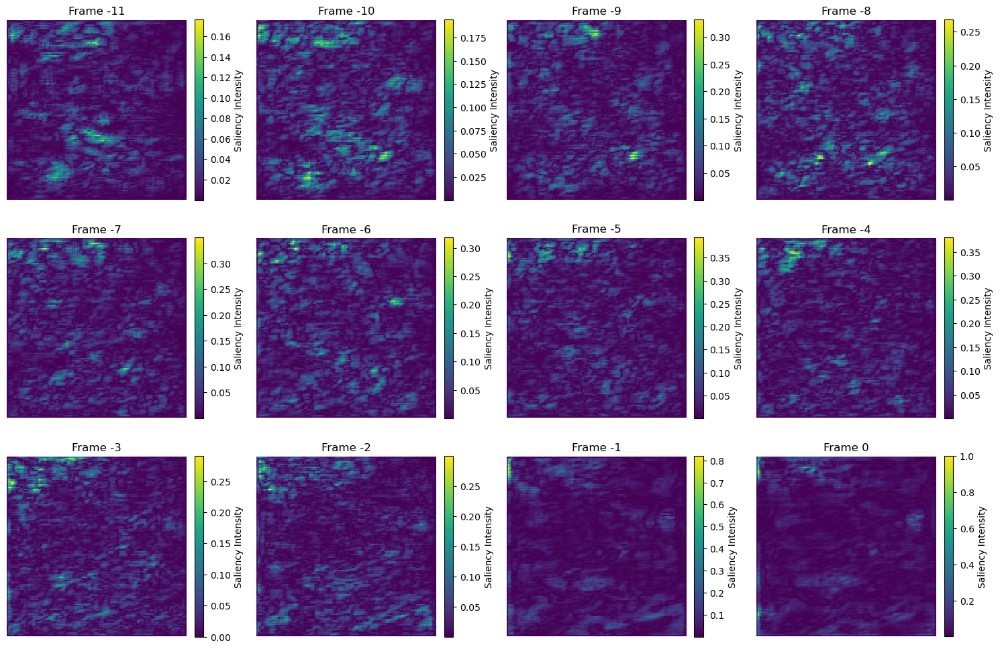

In [23]:
plot_maps(saliency[0], normalize=True)

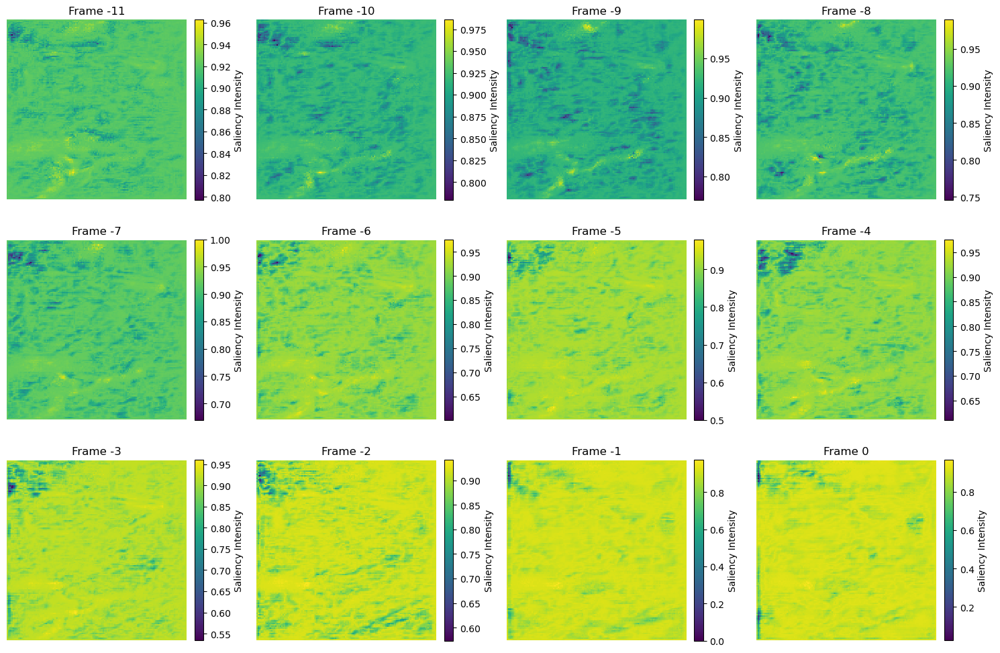

In [24]:
plot_maps(input_grad[0], normalize=True)

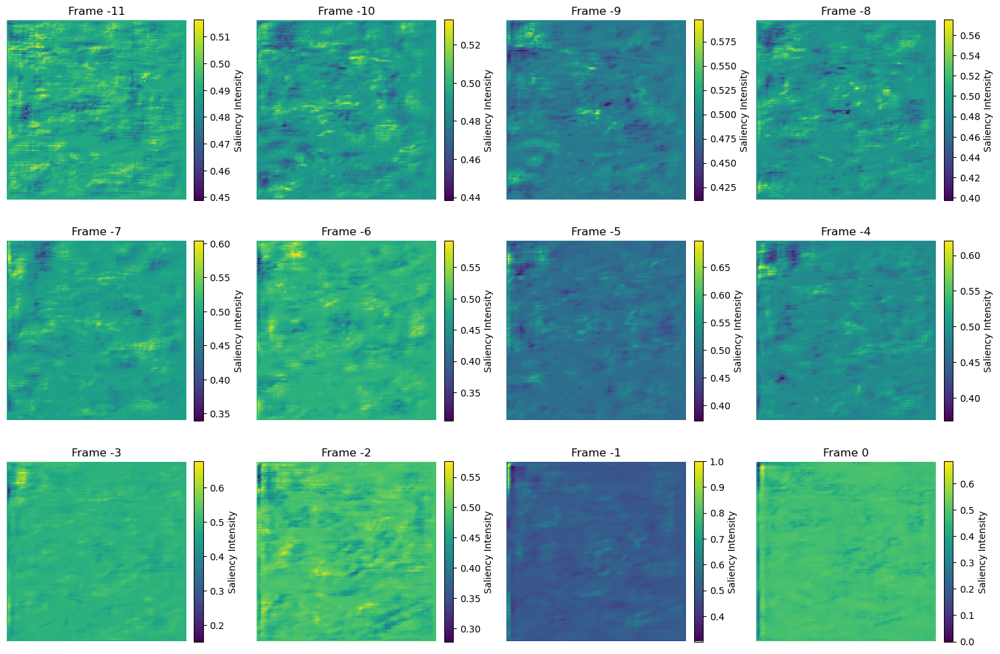

In [25]:
plot_maps(integrated_gradients[0], normalize=True)

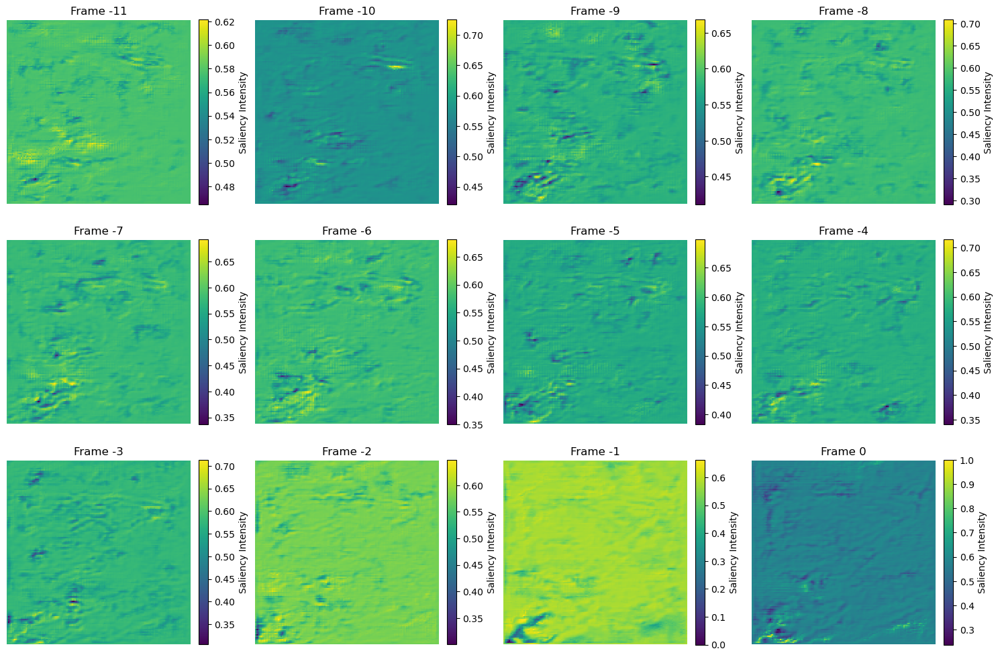

In [26]:
plot_maps(guided_bp[0], normalize=True)

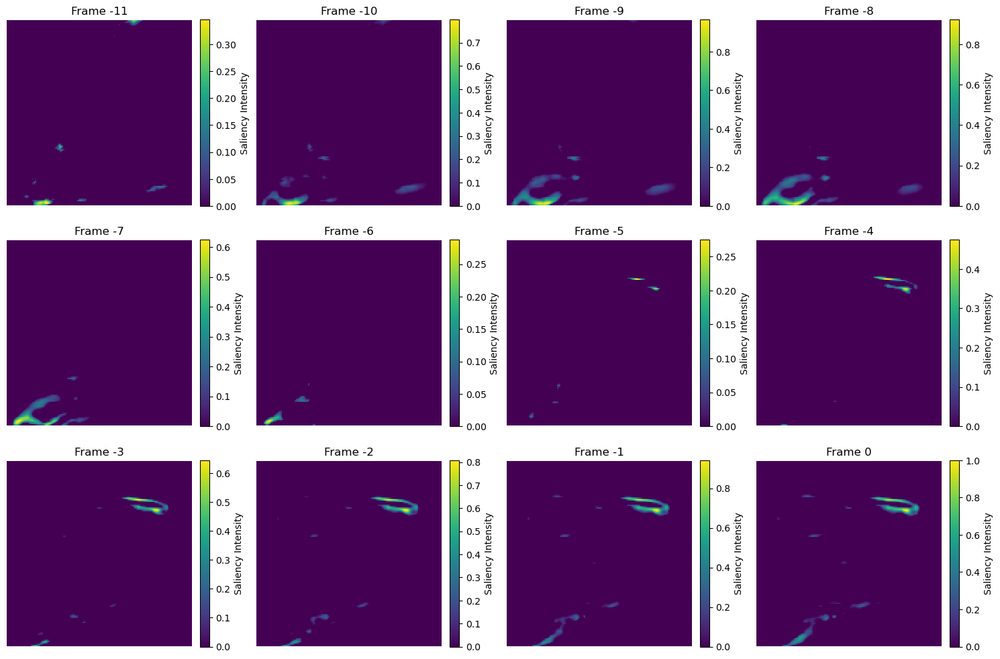

In [27]:
plot_maps(gradcam[0], normalize=True)

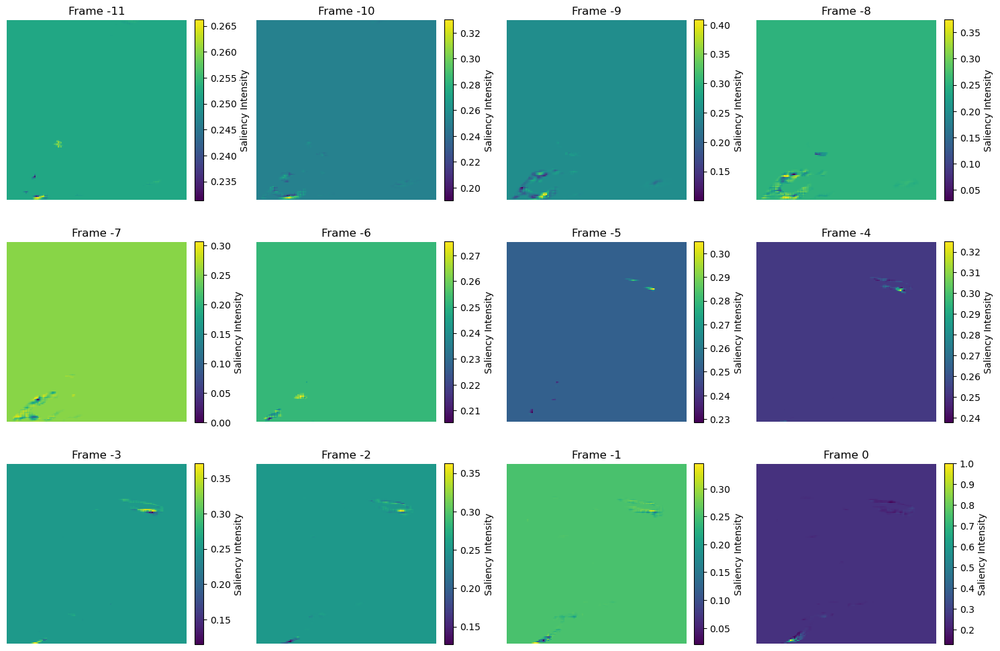

In [28]:
plot_maps(guided_gradcam[0], normalize=True)

In [29]:

def plot_maps_4(inputs, targets, preds, saliency, normalize=False):
    fig, axes = plt.subplots(12, 4, figsize=(15, 30))  # 12 filas, 4 columnas
    axes = axes.flatten()

    # Normalize the Saliency Maps 
    if normalize:
        saliency_max = np.max(saliency)
        saliency_min = np.min(saliency)
        saliency_norm = (saliency - saliency_min) / (saliency_max - saliency_min)
    else:
        saliency_norm = saliency
    
    # Visualization of 4 maps in columns
    for i in range(12):
        # Inputs
        im_input = axes[i * 4].imshow(inputs[i], cmap="viridis", interpolation="nearest")
        axes[i * 4].set_title(f"Input {-11 + i}")
        axes[i * 4].axis("off")

        # Color bar
        cbar = fig.colorbar(im_input, ax=axes[i * 4], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Wind Speed (m/s)', rotation=90)
        
        # Mostrar el target (Frame i)
        im_target = axes[i * 4 + 1].imshow(targets[i], cmap="viridis", interpolation="nearest")
        axes[i * 4 + 1].set_title(f"Target {i}")
        axes[i * 4 + 1].axis("off")

        # Color bar
        cbar = fig.colorbar(im_input, ax=axes[i * 4 + 1], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Wind Speed (m/s)', rotation=90)
        
        # Mostrar la predicción (Frame i)
        im_pred = axes[i * 4 + 2].imshow(preds[i], cmap="viridis", interpolation="nearest")
        axes[i * 4 + 2].set_title(f"Pred {i}")
        axes[i * 4 + 2].axis("off")

        # Color bar
        cbar = fig.colorbar(im_input, ax=axes[i * 4 + 2], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Wind Speed (m/s)', rotation=90)
        
        # Mostrar el mapa de saliencia (Frame i)
        im_saliency = axes[i * 4 + 3].imshow(saliency_norm[i], cmap="viridis", interpolation="nearest")
        axes[i * 4 + 3].set_title(f"Saliency {-11 + i}")
        axes[i * 4 + 3].axis("off")
        
        # Añadir barra de color para cada mapa de saliencia
        cbar = fig.colorbar(im_saliency, ax=axes[i * 4 + 3], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Intensity', rotation=90)

    plt.tight_layout()
    plt.show()


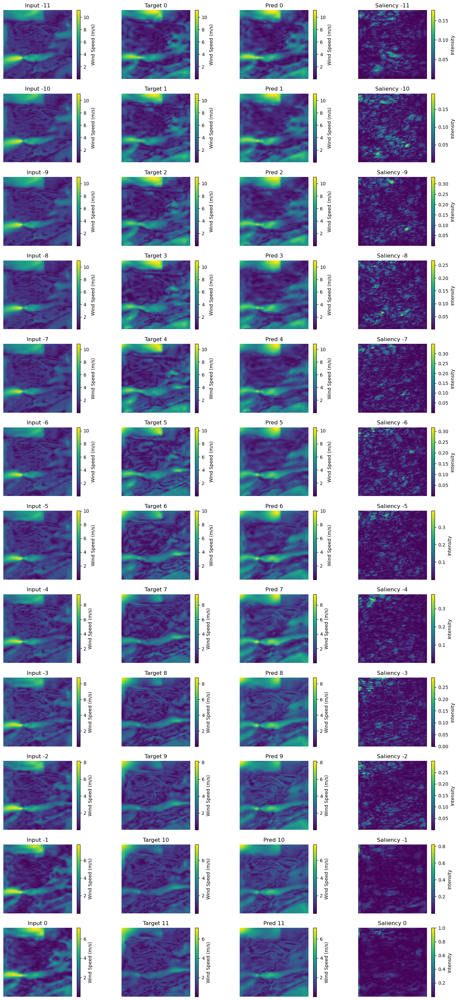

In [30]:
plot_maps_4(inputs[0], targets[0], preds[0], saliency[0], normalize=True)

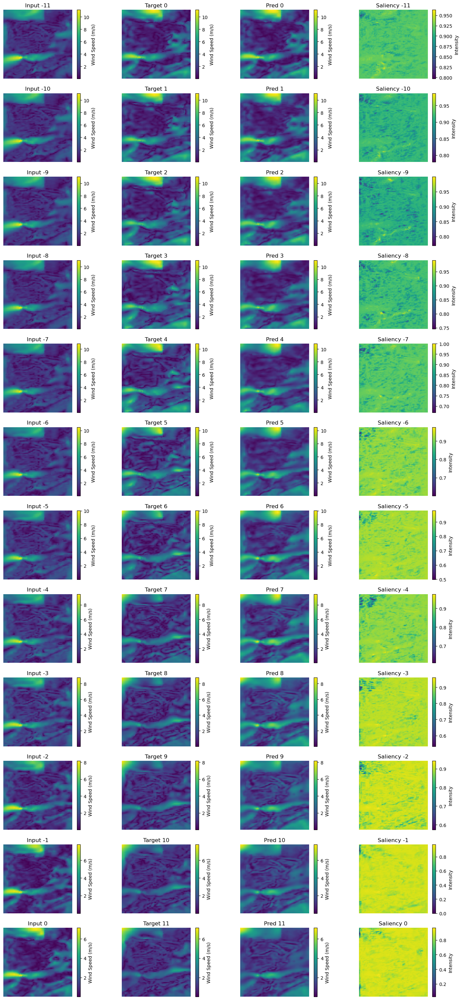

In [31]:
plot_maps_4(inputs[0], targets[0], preds[0], input_grad[0], normalize=True)

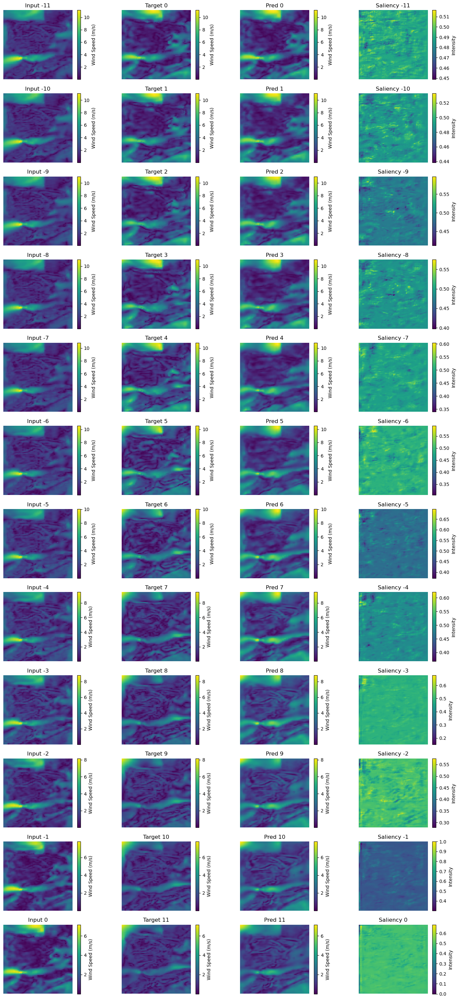

In [32]:
plot_maps_4(inputs[0], targets[0], preds[0], integrated_gradients[0], normalize=True)

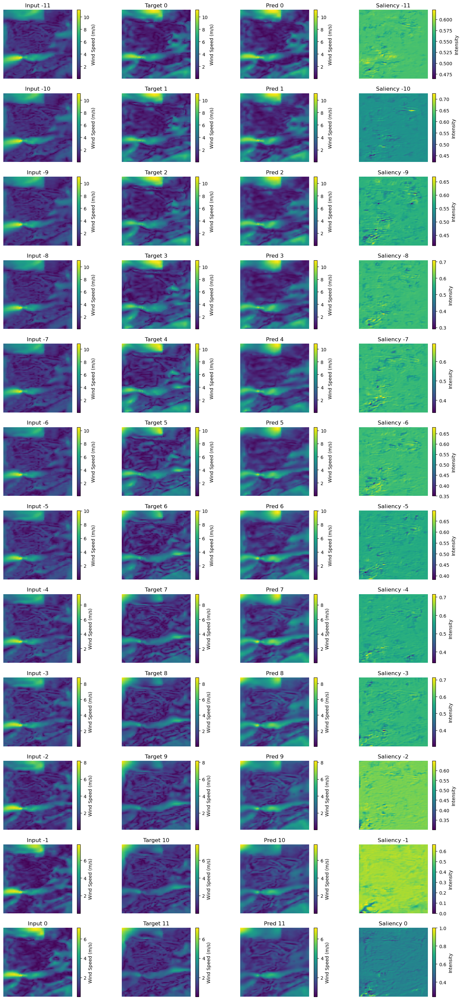

In [33]:
plot_maps_4(inputs[0], targets[0], preds[0], guided_bp[0], normalize=True)

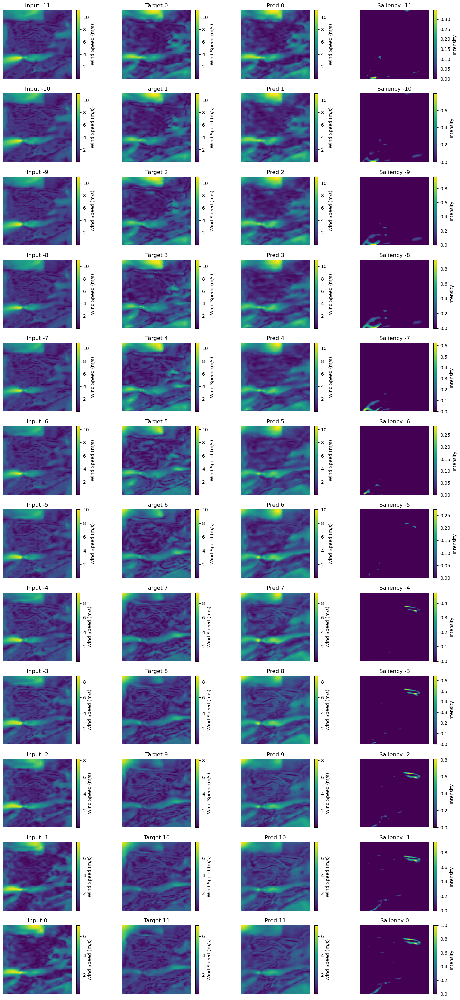

In [34]:
plot_maps_4(inputs[0], targets[0], preds[0], gradcam[0], normalize=True)

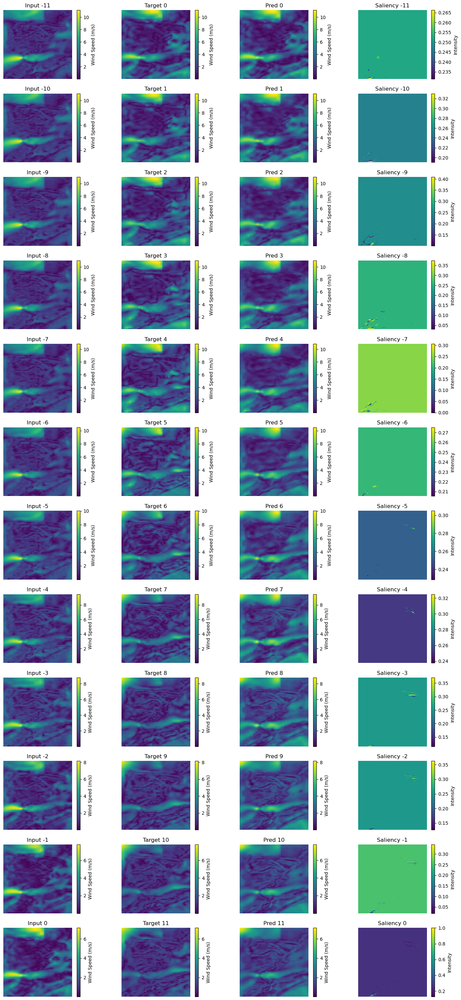

In [35]:
plot_maps_4(inputs[0], targets[0], preds[0], guided_gradcam[0], normalize=True)

In [36]:
def plot_comparison_maps(inputs, saliency, input_grad, integrated_gradients, guided_bp, gradcam, guided_gradcam, normalize=False):
    fig, axes = plt.subplots(12, 7, figsize=(15, 30))  # 12 filas, 4 columnas
    axes = axes.flatten()

    # Normalize the Saliency Maps 
    if normalize:
        saliency_max = np.max(saliency)
        saliency_min = np.min(saliency)
        saliency_norm = (saliency - saliency_min) / (saliency_max - saliency_min)

        input_grad_max = np.max(input_grad)
        input_grad_min = np.min(input_grad)
        input_grad_norm = (input_grad - input_grad_min) / (input_grad_max - input_grad_min)

        integrated_gradients_max = np.max(integrated_gradients)
        integrated_gradients_min = np.min(integrated_gradients)
        integrated_gradients_norm = (integrated_gradients - integrated_gradients_min) / (integrated_gradients_max - integrated_gradients_min)

        guided_bp_max = np.max(guided_bp)
        guided_bp_min = np.min(guided_bp)
        guided_bp_norm = (guided_bp - guided_bp_min) / (guided_bp_max - guided_bp_min)

        gradcam_max = np.max(gradcam)
        gradcam_min = np.min(gradcam)
        gradcam_norm = (gradcam - gradcam_min) / (gradcam_max - gradcam_min)

        guided_gradcam_max = np.max(guided_gradcam)
        guided_gradcam_min = np.min(guided_gradcam)
        guided_gradcam_norm = (guided_gradcam - guided_gradcam_min) / (guided_gradcam_max - guided_gradcam_min)
    else:
        saliency_norm = saliency
        input_grad_norm = input_grad
        integrated_gradients_norm = integrated_gradients
        guided_bp_norm = guided_bp
        gradcam_norm = gradcam
        guided_gradcam_norm = guided_gradcam
    
    # Visualization of 4 maps in columns
    for i in range(12):
        # Inputs
        im_input = axes[i * 7].imshow(inputs[i], cmap="viridis", interpolation="nearest")
        axes[i * 7].set_title(f"Frame: {-11 + i}")
        axes[i * 7].axis("off")

        # Color bar
        cbar = fig.colorbar(im_input, ax=axes[i * 7], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Wind Speed (m/s)', rotation=90)
        
        # Saliency 
        im_saliency = axes[i * 7 + 1].imshow(saliency_norm[i], cmap="viridis", interpolation="nearest")
        axes[i * 7 + 1].set_title(f"Frame: {-11 + i}")
        axes[i * 7 + 1].axis("off")

        # Color bar
        cbar = fig.colorbar(im_saliency, ax=axes[i * 7 + 1], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Importance', rotation=90)
        
        # InputGrad
        im_input_grad = axes[i * 7 + 2].imshow(input_grad_norm[i], cmap="viridis", interpolation="nearest")
        axes[i * 7 + 2].set_title(f"Frame: {-11 + i}")
        axes[i * 7 + 2].axis("off")

        # Color bar
        cbar = fig.colorbar(im_input_grad, ax=axes[i * 7 + 2], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Importance', rotation=90)
        
        # IntegratedGrad
        im_integrated_gradients = axes[i * 7 + 3].imshow(integrated_gradients_norm[i], cmap="viridis", interpolation="nearest")
        axes[i * 7 + 3].set_title(f"Frame: {-11 + i}")
        axes[i * 7 + 3].axis("off")
        
        # Color bar
        cbar = fig.colorbar(im_integrated_gradients, ax=axes[i * 7 + 3], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Saliency Intensity', rotation=90)

        # Guided Bp
        im_guided_bp = axes[i * 7 + 4].imshow(guided_bp_norm[i], cmap="viridis", interpolation="nearest")
        axes[i * 7 + 4].set_title(f"Frame: {-11 + i}")
        axes[i * 7 + 4].axis("off")

        # Color bar
        cbar = fig.colorbar(im_guided_bp, ax=axes[i * 7 + 4], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Importance', rotation=90)
        
        # GradCAM
        im_gradcam = axes[i * 7 + 5].imshow(gradcam_norm[i], cmap="viridis", interpolation="nearest")
        axes[i * 7 + 5].set_title(f"Frame: {-11 + i}")
        axes[i * 7 + 5].axis("off")

        # Color bar
        cbar = fig.colorbar(im_gradcam, ax=axes[i * 7 + 5], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Importance', rotation=90)
        
        # Guided GradCAM
        im_guided_gradcam = axes[i * 7 + 6].imshow(guided_gradcam_norm[i], cmap="viridis", interpolation="nearest")
        axes[i * 7 + 6].set_title(f"Frame: {-11 + i}")
        axes[i * 7 + 6].axis("off")

        # Color bar
        cbar = fig.colorbar(im_guided_gradcam, ax=axes[i * 7 + 6], orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Importance', rotation=90)

    column_titles = ["Input", "Saliency", "Input Grad", "Integrated Grad", "Guided BP", "GradCAM", "Guided GradCAM"]
    for col, title in enumerate(column_titles):
        fig.text(0.05 + col * (1 / 7), 0.99, title, ha='center', va='bottom', fontsize=14, fontweight='bold')

    plt.tight_layout()
    plt.show()

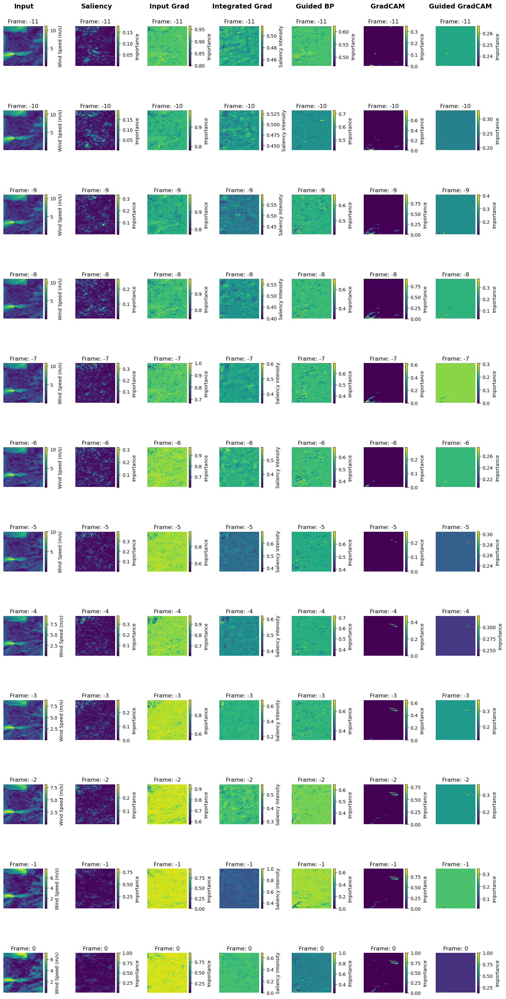

In [37]:
plot_comparison_maps(inputs[0], saliency[0], input_grad[0], integrated_gradients[0], guided_bp[0], gradcam[0], guided_gradcam[0], normalize=True)

#### Integrate

In [38]:
def plot_integrated_maps(importance_map, log=False):
    """
    Plot the integration of each Saliency map
    
    Parámetros:
    - Saliency maps: 12 Saliency maps of 144x144.
    """

    integrated_importance_map = importance_map.sum(axis=(1, 2))

    plt.figure(figsize=(10, 6))
    plt.plot(range(-11, 1), integrated_importance_map, label='Integrated Saliency', marker='o', color='b')
    plt.axhline(np.mean(integrated_importance_map), color='r', linestyle='--', label='Integrated Importance map (Promedio)')
    
    # Añadir etiquetas y leyenda
    plt.title("Integrated Saliency vs horizon")
    plt.xlabel("Horizon (h)")
    plt.ylabel("Integrated Saliency")
    if log:
        plt.yscale('log')
    plt.legend()
    plt.xticks(range(-11, 1))  # Asegurar que cada frame sea etiquetado correctamente
    plt.grid(True)
    plt.show()

In [39]:
log = False

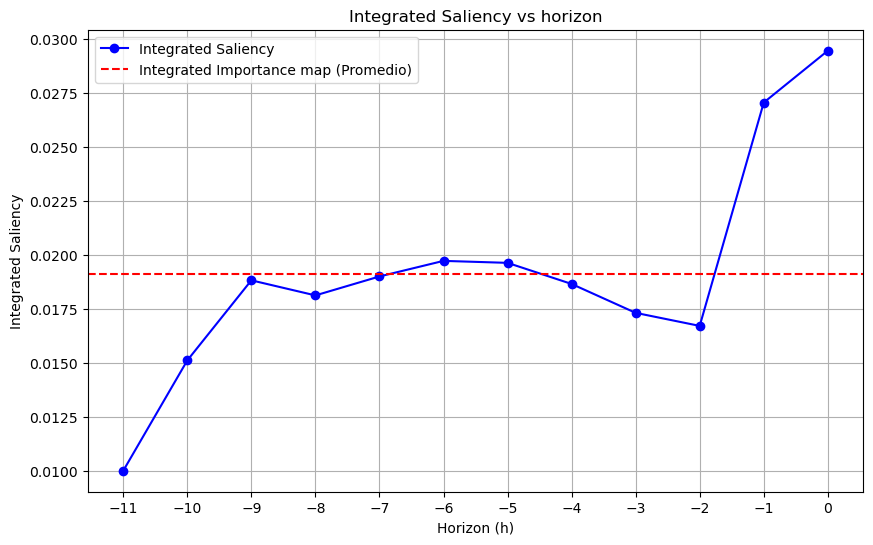

In [40]:
plot_integrated_maps(saliency[0], log=log)

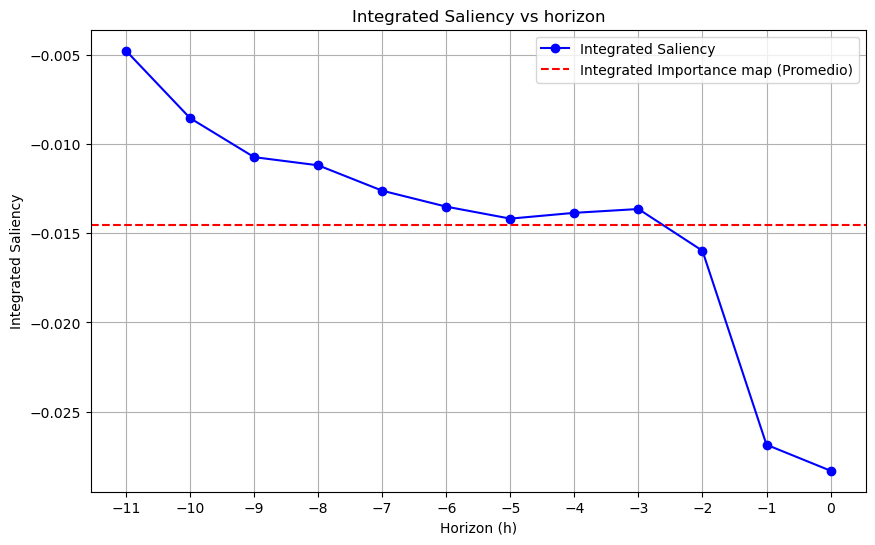

In [41]:
plot_integrated_maps(input_grad[0], log=log)

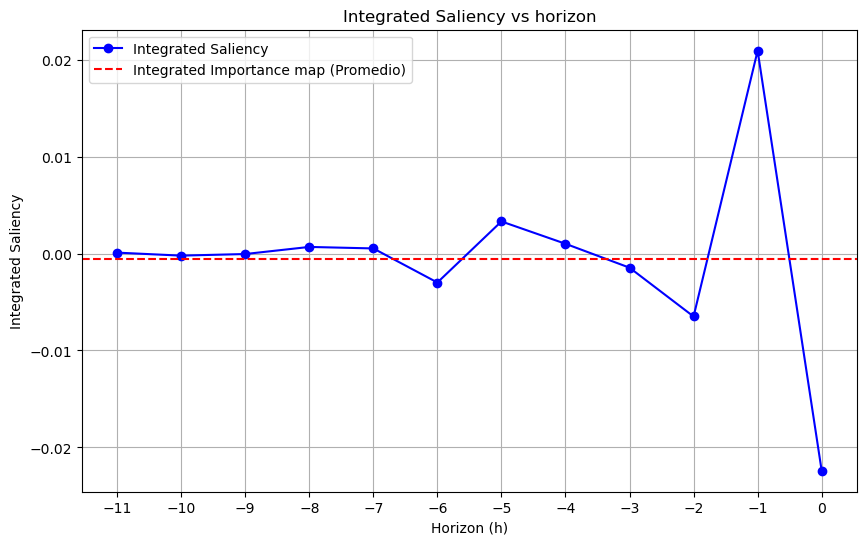

In [42]:
plot_integrated_maps(integrated_gradients[0], log=log)

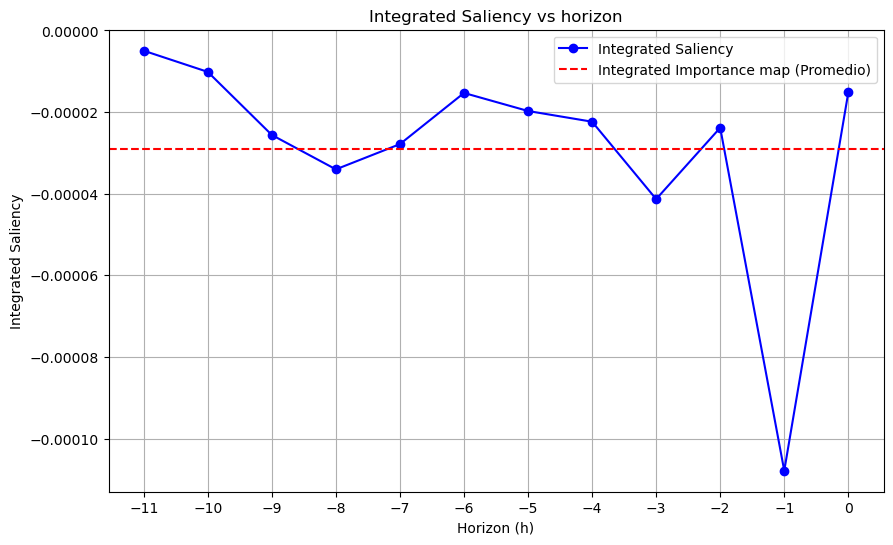

In [43]:
plot_integrated_maps(guided_bp[0], log=log)

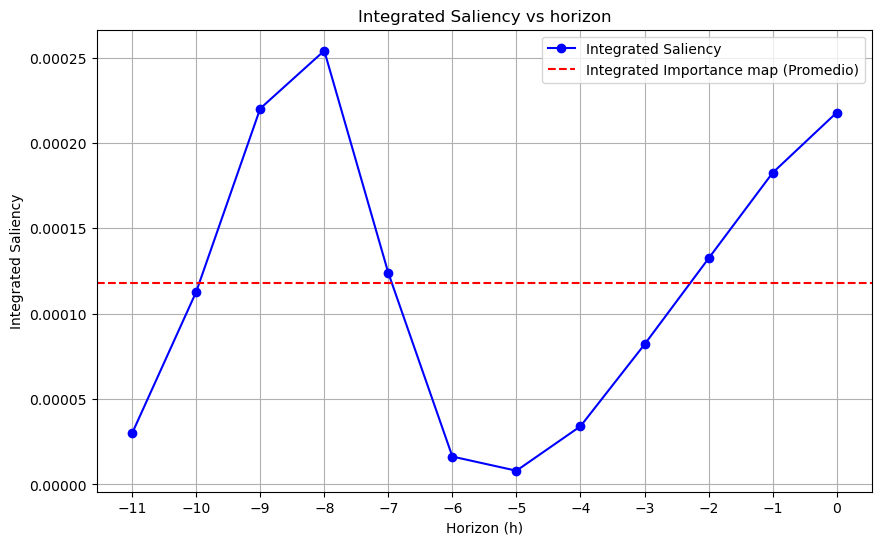

In [44]:
plot_integrated_maps(gradcam[0], log=log)

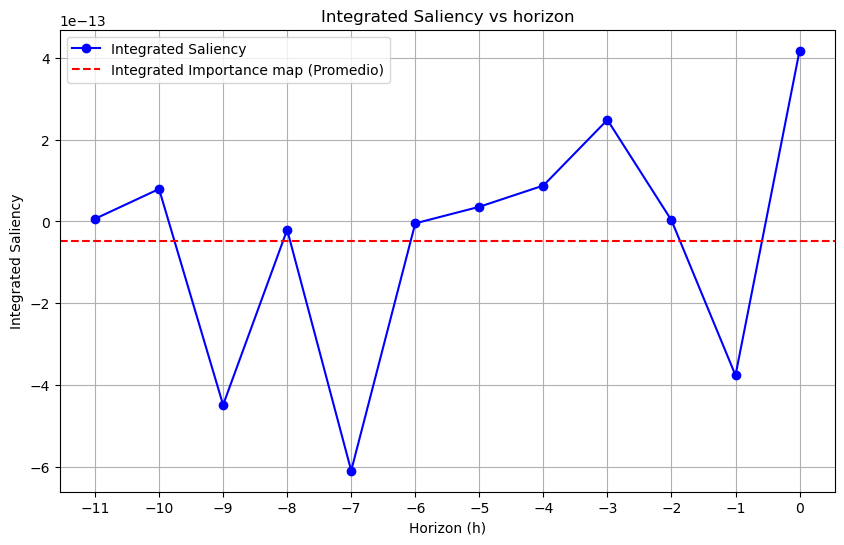

In [45]:
plot_integrated_maps(guided_gradcam[0], log=log)

#### Create a Forward Model Function

In [46]:
def forward_convLSTM(input_tensor):
    """
    Forward call to the model embebed in a function compatible with SHAP.
    
    Args:
        input_tensor (torch.Tensor): Input tensor [batch_size, 12, 1, 144, 144].
        
    Returns:
        torch.Tensor: Predicción of the model [batch_size, 12, 1, 144, 144].
    """

    #input_tensor = torch.tensor(input_tensor, dtype=torch.float32)

    #model.eval()  
    #with torch.no_grad():

    input_tensor = input_tensor#.to(device) 
    print(input_tensor.unsqueeze(0).unsqueeze(2).shape)
    output = net(input_tensor.unsqueeze(0).unsqueeze(2)).squeeze(2)[:, output_frame, :, :, :].mean()  
    print('Output: ', output.shape)
    return output#.to('cpu')

#### Using Captum library. Define interpretability techniques (saliency maps)

In [47]:
# Indivual techniques used
#saliency = Saliency(lambda x: forward_convLSTM(net, input_tensor=x, output_frame=0))
#input_x_gradient = InputXGradient(lambda x: forward_convLSTM(net, output_frame=0, input_sequence=x))
#integrated_gradients = IntegratedGradients(lambda x: forward_convLSTM(net, output_frame=0, input_sequence=x))
#deeplift = DeepLift(lambda x: forward_convLSTM(net, output_frame=0, input_sequence=x))

#saliency = Saliency(forward_convLSTM)
#input_x_gradient = InputXGradient(forward_convLSTM)
#integrated_gradients = IntegratedGradients(forward_convLSTM)
#deeplift = DeepLift(forward_convLSTM)

# Apply smoothGrad (NoiseTunnel) to reduce the noise in the attributions
#smoothgrad_saliency = NoiseTunnel(saliency)
#smoothgrad_input_x_gradient = NoiseTunnel(input_x_gradient)
#smoothgrad_integrated_gradients = NoiseTunnel(integrated_gradients)
#smoothgrad_deeplift = NoiseTunnel(deeplift)

#### Define matrices to save results

In [48]:
# Empty lists to track the data
#saliency_attr_coll = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
#input_x_gradient_attr_coll = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
#integrated_gradients_attr_coll = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')
#deeplift_attr_coll = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')

#### Calcule Saliency Maps

In [49]:
output_frame = 0 

t = tqdm(data, leave=True, total=len(data))
        
for i, (inputVar, targetVar, _, indices) in enumerate(t):
            
    #t.set_description("Epoch = {}".format(i))
            
    inputs = inputVar.to(device)
    target = targetVar.to(device)

    net.eval()
    inputs.requires_grad = True

    # Iterar ove the batch to calculate saliency maps for each single sample
    #for i in range(inputs.shape[0]): 
    if True:
        saliency_map = saliency.attribute(inputs, abs=True)  # Procesamos por cada imagen en el batch
        #saliency_map = saliency.attribute(inputs[i:i+1], target=None)

        # Convertir a numpy y normalizar
        saliency_map = saliency_map.detach().cpu().numpy()  # (1, 12, 1, 144, 144)


        attr_sg_saliency = smoothgrad_saliency.attribute(inputs, target=target[:, output_frame, :, :], nt_type='smoothgrad', nt_samples=10, stdevs=0.2)
        #attr_sg_input_x_gradient = smoothgrad_input_x_gradient.attribute(inputs, nt_type='smoothgrad', nt_samples=50, stdevs=0.2)
        #attr_sg_integrated_gradients = smoothgrad_integrated_gradients.attribute(inputs, nt_type='smoothgrad', nt_samples=50, stdevs=0.2, baselines=torch.zeros_like(inputs).to(args.device))
        #attr_sg_deeplift = smoothgrad_deeplift.attribute(inputs, nt_type='smoothgrad', nt_samples=50, stdevs=0.2, baselines=torch.zeros_like(inputs).to(args.device))
        print(saliency_map.shape)

    # save data according to the correct index
    for j, index in enumerate(indices):
        
        #saving attributes for each method
        saliency_attr_coll[index] = attr_sg_saliency[j].detach().cpu()
        #input_x_gradient_attr_coll[index] = attr_sg_input_x_gradient[j].detach().cpu()
        #integrated_gradients_attr_coll[index] = attr_sg_integrated_gradients[j].detach().cpu()
        #deeplift_attr_coll[index] = attr_sg_deeplift[j].detach().cpu()
               
    torch.cuda.empty_cache()

saliency_attr_coll = saliency_attr_coll.numpy() 
#input_x_gradient_attr_coll = input_x_gradient_attr_coll.numpy()
#integrated_gradients_attr_coll = integrated_gradients_attr_coll.numpy()
#deeplift_attr_coll = deeplift_attr_coll.numpy()            
  
# Save the predictions for the test dataset
print('Saving data...')
saliency_da = xr.DataArray(saliency_attr_coll, coords=data.input_coords, dims=data.dims)
#input_x_gradient_da = xr.DataArray(input_x_gradient_attr_coll, coords=test_ds.input_coords, dims=test_ds.dims)
#integrated_gradients_da = xr.DataArray(integrated_gradients_attr_coll, coords=test_ds.input_coords, dims=test_ds.dims)
#deeplift_da = xr.DataArray(deeplift_attr_coll, coords=test_ds.input_coords, dims=test_ds.dims)
            

#output_test_ds = xr.Dataset({'saliency': saliency_da, 'InpGrad': input_x_gradient_da, 'IntGrad': integrated_gradients_da, 'DeepLift: deeplift_da})
output_test_ds = xr.Dataset({'saliency': saliency_da})

output_test_ds.to_netcdf(os.path.join(os.getcwd(), 'SaliencyMaps_{}.nc'.format(split)))

  0%|          | 0/731 [00:00<?, ?it/s]


AttributeError: 'numpy.ndarray' object has no attribute 'attribute'

In [12]:
class WrappedModel(nn.Module):
    def __init__(self, model):
        super(WrappedModel, self).__init__()
        self.model = model  # tu modelo pre-entrenado

    def forward(self, input_tensor):
        """
        Modifica la salida del modelo para hacerla compatible con SHAP
        (reducción a un valor escalar por cada imagen).
        
        Args:
            input_tensor (torch.Tensor): Tensor de entrada [batch_size, 12, 1, 144, 144]
        
        Returns:
            torch.Tensor: Salida del modelo reducida a un escalar [batch_size].
        """
        output_frame = 0  # select one of the output frames
        input_tensor = input_tensor.to(device)
        self.output = model(input_tensor).squeeze(2)  # [batch_size, 12, 144, 144]
        output = output[:, output_frame, :, :]  # reduce using the mean/sum
        return output  

In [13]:
wrapped_model = WrappedModel(model).to(device)

#### Retrive all the data to create the background, that is, a representative subsample of the X_train. 

In [ ]:
# Define empty lists to keep the predictions
input_coll = torch.zeros((len(data), frames_predict, data.dataset_spatial_size, data.dataset_spatial_size), device='cpu')

t = tqdm(dataLoader, leave=True, total=len(dataLoader))
        
for i, (inputVar, _, _, indices) in enumerate(t):

    # save data according to the correct index
    for j, index in enumerate(indices):
                   
        #saving variables
        input_coll[index] = inputVar[j].detach().requires_grad_(True)

del inputVar, indices

# if KernelExplainer
#input_coll = input_coll.detach().numpy()

In [ ]:
print(input_coll.shape)